In [6]:
import os
from PIL import Image
from tqdm import tqdm
import torch
import torch.nn.functional as F
import pandas as pd
import pickle
from dreamsim import dreamsim, PerceptualModel

# Setup
device = "cuda" if torch.cuda.is_available() else "cpu"
model, _ = dreamsim(pretrained=True)

# Load models
dreamsim_model = model
dino_model = PerceptualModel(
    feat_type="cls", model_type="dino_vitb16", stride="16", baseline=True, device=device
)
open_clip_model = PerceptualModel(
    feat_type="embedding",
    model_type="open_clip_vitb32",
    stride="32",
    baseline=True,
    device=device,
)

Using cached ./models


Using cache found in ./models/facebookresearch_dino_main
Using cache found in ./models/facebookresearch_dino_main


In [7]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

In [8]:
# Setup device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Define preprocess for datasets
preprocess = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ]
)

# Load datasets
train_dataset = datasets.ImageFolder(
    "/mnt/storage/CUB_200_2011/train1", transform=preprocess
)
test_dataset = datasets.ImageFolder(
    "/mnt/storage/CUB_200_2011/test0", transform=preprocess
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


# Function to get embeddings for a dataset
def get_dataset_embeddings(model, loader):
    model.eval()
    embeddings = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            embeds = model.embed(images).detach().cpu()
            embeddings.append(embeds)
    embeddings = torch.cat(embeddings, dim=0)
    return embeddings


# Compute embeddings for train and test datasets
# train_embeddings = get_dataset_embeddings(dreamsim_model, train_loader)
# test_embeddings = get_dataset_embeddings(dreamsim_model, test_loader)

In [13]:
# Function to compute and save embeddings for a dataset
def compute_and_save_embeddings(model, loader, save_path):
    # if exists, return
    if os.path.exists(save_path):
        return

    embeddings = get_dataset_embeddings(model, loader)
    torch.save(embeddings, save_path)
    print(f"Saved embeddings to {save_path}")


# Compute and save embeddings for train and test datasets using all models
compute_and_save_embeddings(
    dreamsim_model, train_loader, "train_embeddings_dreamsim.pt"
)
compute_and_save_embeddings(dreamsim_model, test_loader, "test_embeddings_dreamsim.pt")

compute_and_save_embeddings(dino_model, train_loader, "train_embeddings_dino.pt")
compute_and_save_embeddings(dino_model, test_loader, "test_embeddings_dino.pt")

compute_and_save_embeddings(
    open_clip_model, train_loader, "train_embeddings_open_clip.pt"
)
compute_and_save_embeddings(
    open_clip_model, test_loader, "test_embeddings_open_clip.pt"
)

Saved embeddings to train_embeddings_dreamsim.pt
Saved embeddings to test_embeddings_dreamsim.pt
Saved embeddings to train_embeddings_dino.pt
Saved embeddings to test_embeddings_dino.pt
Saved embeddings to train_embeddings_open_clip.pt
Saved embeddings to test_embeddings_open_clip.pt


In [21]:
import matplotlib.pyplot as plt
from PIL import Image


def visualize_neighbors_for_all_models(query_index):
    fig, axes = plt.subplots(3, 6, figsize=(24, 12))
    models = ["DreamSim", "DINO", "OpenCLIP"]
    test_img_path, _ = test_dataset.samples[query_index]
    test_img = Image.open(test_img_path).convert("RGB")

    for i, model_name in enumerate(models):
        test_embeddings_path = f"test_embeddings_{model_name.lower()}.pt"
        train_embeddings_path = f"train_embeddings_{model_name.lower()}.pt"
        nearest_indices, distances = load_embeddings_and_find_neighbors(
            test_embeddings_path, train_embeddings_path, query_index
        )

        axes[i, 0].imshow(test_img)
        axes[i, 0].set_title(
            f"Query\n{model_name}", fontsize=16, fontweight="bold", color="blue"
        )
        axes[i, 0].axis("off")

        for j, idx in enumerate(nearest_indices):
            train_img_path, _ = train_dataset.samples[idx]
            train_img = Image.open(train_img_path).convert("RGB")
            axes[i, j + 1].imshow(train_img)
            axes[i, j + 1].set_title(
                f"Neighbor {j+1}\nDist: {distances[j]:.2f}",
                fontsize=12,
                fontweight="regular",
            )
            axes[i, j + 1].axis("off")

    plt.tight_layout()
    plt.show()

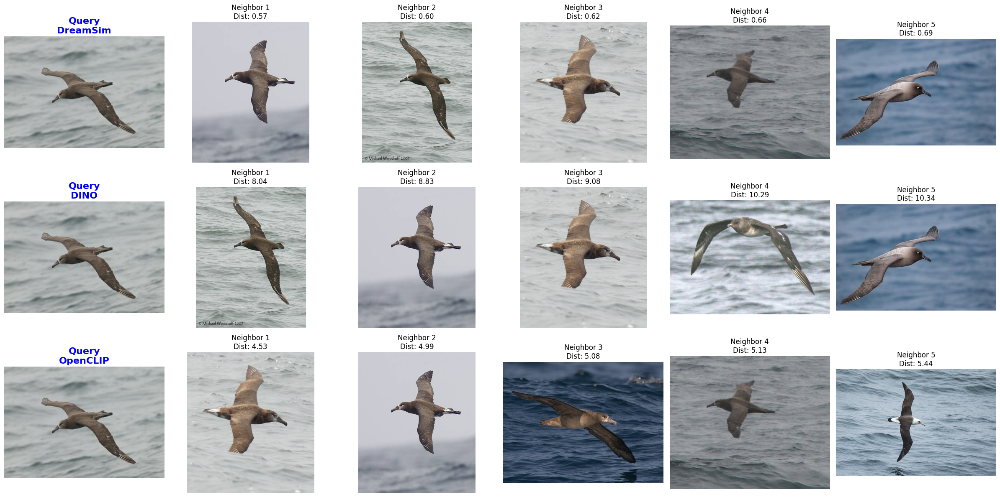

In [22]:
# Example usage
query_index = 0  # Change as needed to test different images from the test set
visualize_neighbors_for_all_models(query_index)

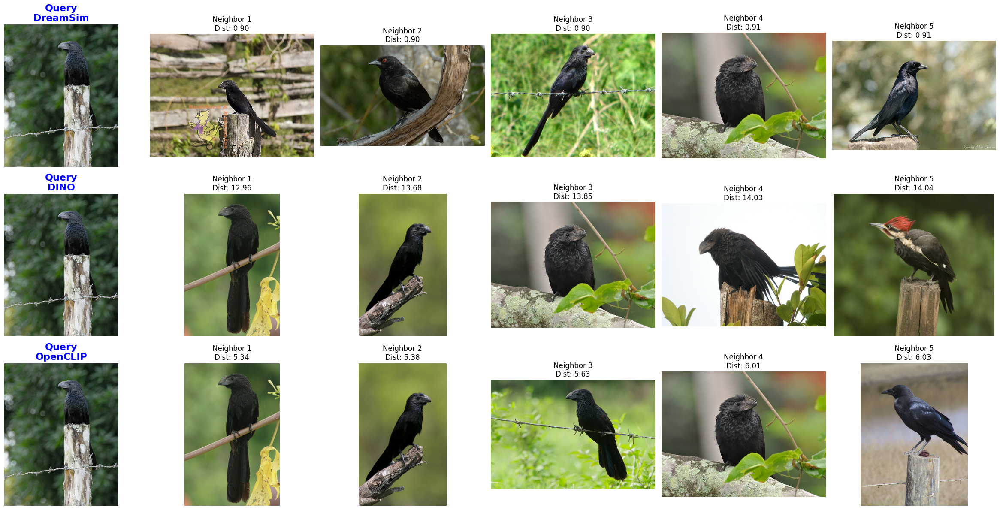

In [24]:
visualize_neighbors_for_all_models(100)

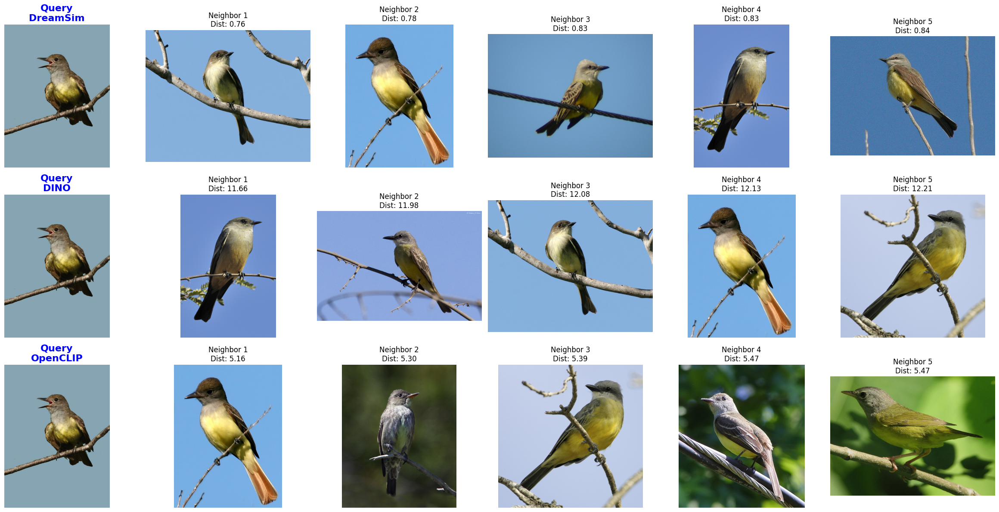

In [26]:
visualize_neighbors_for_all_models(1021)